In [2]:
import numpy as np
import matplotlib.pyplot as plt
from utils import *
from dataset import *
from constants import *
from Examples.Functions_examples import *
from tqdm import tqdm
from scipy.signal import welch
import scipy.stats as stats
from scipy.stats import ttest_rel
from statsmodels.stats.multitest import multipletests
from scipy.signal import hilbert
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score


## Load Data

#### Load raw data from pickle file

In [3]:
data = load_pickle('../Data/Dataset_4subjects_Exe_Obs')

#### Select participant and session (session only for plot purposes)

In [4]:
participant = 's11'
session = data[participant]['sess1']

Compute PSD for each baselines and activities, then mean it

100%|██████████| 133/133 [00:02<00:00, 61.72it/s] 


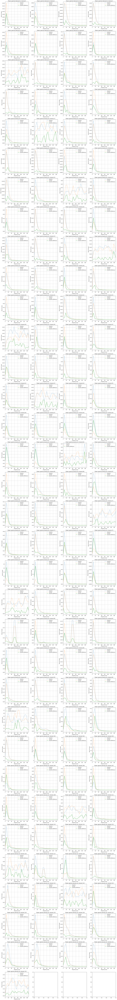

[15, 33, 42, 73, 84, 97, 98, 117, 128, 129]


100%|██████████| 133/133 [00:05<00:00, 24.71it/s]


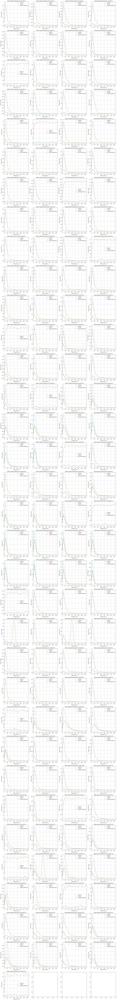

[0, 13, 17, 35, 84, 96, 97, 98, 99, 122, 128, 132]


In [5]:
def get_relevant_channels(participant, alpha=0.05, fs=2048, mean='time', plot=False):
    if mean not in ['time', 'freq']: raise ValueError('mean must be either "time" or "freq"')
    nb_channels = data[participant]['sess1']['neural_data'].shape[0]

    if plot:
        num_cols = 4
        fig_width = 20

        num_rows = int(np.ceil(nb_channels / num_cols))
        fig_height = fig_width * num_rows / num_cols
        _, axs = plt.subplots(num_rows, num_cols, figsize=(fig_width, fig_height), sharey=False)
        axs = axs.flatten()

    ttests = []
    p_values = []

    for channel_id in tqdm(range(nb_channels)):
        baselines, activities = get_baselines_and_activities(session, channel_id)
        if mean == 'time':
                mean_baseline = np.array(baselines).mean(axis=0)
                mean_activity = np.array(activities).mean(axis=0)
                mean_baseline_psd = welch(mean_baseline, fs=fs)
                mean_activity_psd = welch(mean_activity, fs=fs)
        elif mean == 'freq':
            baselines_psds = []
            activities_psds = []
            for i in range(len(baselines)):
                baselines_psds.append(welch(baselines[i], fs=fs))
                activities_psds.append(welch(activities[i], fs=fs))
            mean_baseline_psd = np.array(baselines_psds).mean(axis=0)
            mean_activity_psd = np.array(activities_psds).mean(axis=0)
        t_stat, p_value = ttest_rel(mean_baseline_psd[1], mean_activity_psd[1])
        ttests.append((t_stat, p_value))
        p_values.append(p_value)
        if plot:
            axs[channel_id].plot(mean_baseline_psd[0], mean_baseline_psd[1], label='baseline', alpha=0.5)
            axs[channel_id].plot(mean_activity_psd[0], mean_activity_psd[1], label='activity', alpha=0.5)
            axs[channel_id].plot(mean_activity_psd[0], abs(mean_baseline_psd[1] - mean_activity_psd[1]), label='absolute difference')
            axs[channel_id].set_title(f'Power spectral density for channel {channel_id}')
            axs[channel_id].set_xlabel('frequency [Hz]')
            axs[channel_id].set_ylabel('PSD [V**2/Hz]')
            axs[channel_id].set_xlim(0, 150)
            axs[channel_id].legend()
            axs[channel_id].grid()

    if plot:
        plt.tight_layout()
        plt.show()

    # _, corrected_p_values, _, _ = multipletests(p_values, alpha=alpha, method='fdr_bh')
    # relevant_channels = [i for i, p in enumerate(corrected_p_values) if p < alpha]
    relevant_channels = [i for i, p in enumerate(p_values) if p < alpha]

    return relevant_channels, ttests

print(get_relevant_channels(participant, plot=True, mean='time')[0])
print(get_relevant_channels(participant, plot=True, mean='freq')[0])

In [ ]:
def subsample(signal, subsampling):
    step = 2048 // subsampling
    return signal[::step]

def get_channels_for_session(session, relevant_channels):
    channels_dict = {}

    for channel_id in tqdm(relevant_channels):
        signal = session['neural_data'][channel_id]
        # Remove frequencies that are too low (noise) or too high (not eeg-related)
        subsignal = bandpass_filter(signal, 0.5, 150)
        subsignal = subsample(signal, 500)
        # TODO filter electrical noise here

        channels_dict[channel_id] = {
            'signal': signal,
            'subsignal': subsignal,
        }

        # for band_name, (low, high) in FREQ_BANDS.items():
        #     # Bandpass filter the channel
        #     filtered_signal = bandpass_filter(subsignal, low, high)
        #     # Take the envelope of the frequency band with a Hilbert transform
        #     enveloped_channel = hilbert(filtered_signal)
        #     enveloped_channel = np.abs(enveloped_channel)
        #     channels_dict[channel_id][band_name] = enveloped_channel

    return channels_dict


In [17]:
def get_trials_for_session(session, relevant_channels):
    channels_dict = get_channels_for_session(session, relevant_channels)

    trial_starts = session['trials_info']['TS_TrialStart']
    trial_action = session['trials_info']['TS_ObjectGrasp']
    no_errors = np.array(session['trials_info']['ErrorCode']) == 0

    trials_dict = {}

    for trial_id in range(len(trial_action)):
        if no_errors[trial_id]:
            trials_dict[trial_id] = {}
            for channel_id in relevant_channels:
                subsignal = channels_dict[channel_id]['subsignal']
                subsignal_baseline = subsignal[int((trial_starts[trial_id]) * 500):int((trial_starts[trial_id] + 1) * 500)]
                subsignal_action = subsignal[int((trial_action[trial_id] - 0.5) * 500):int((trial_action[trial_id] + 0.5) * 500)]
                normalized_signal = subsignal_action - subsignal_baseline
                trials_dict[trial_id][channel_id] = {}
                for band_name, (low, high) in FREQ_BANDS.items():
                    # Bandpass filter the channel
                    filtered_signal = bandpass_filter(normalized_signal, low, high)
                    # Take the envelope of the frequency band with a Hilbert transform
                    enveloped_channel = hilbert(filtered_signal)
                    enveloped_channel = np.abs(enveloped_channel)
                    trials_dict[trial_id][channel_id][band_name] = enveloped_channel
                    
    print(f'Found {len(trials_dict)} valid trials...')
    return trials_dict

## Observe first element of dictionary

100%|██████████| 10/10 [00:11<00:00,  1.10s/it]


Found 64 valid trials...


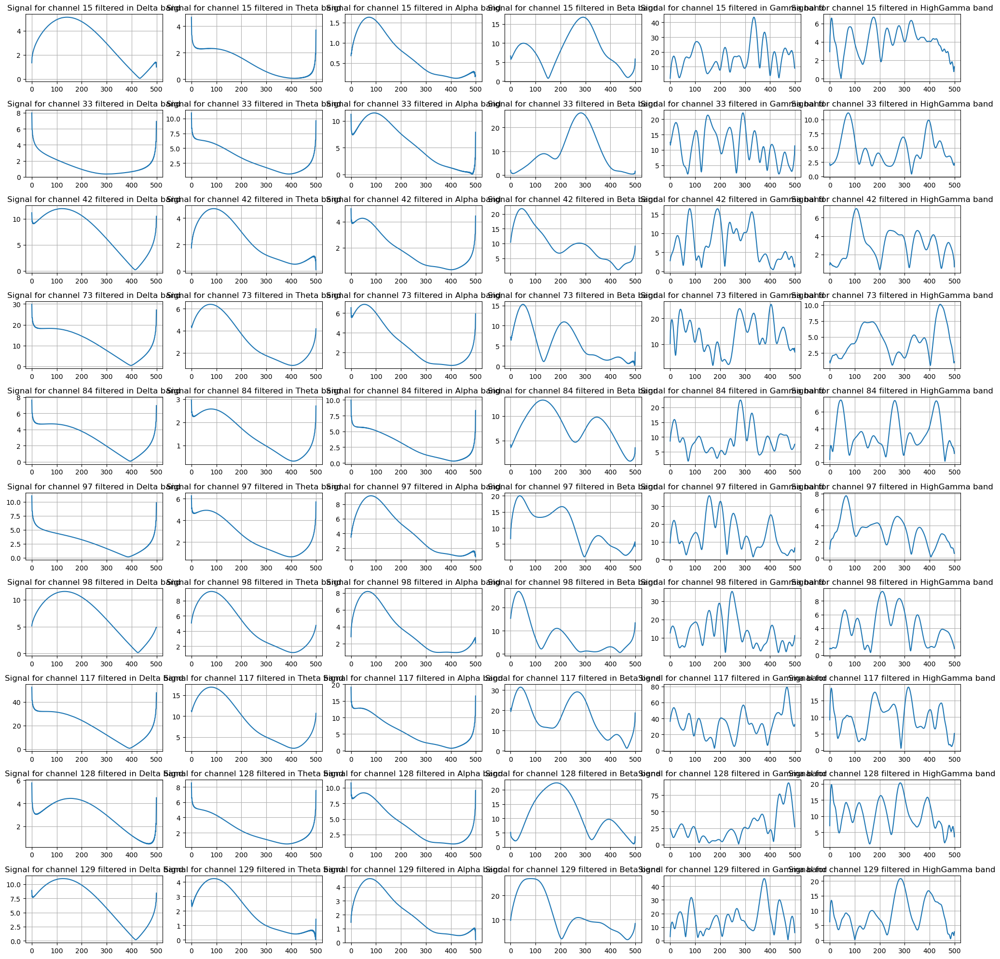

In [18]:
relevant_channels = get_relevant_channels(participant)[0]
trials_dict = get_trials_for_session(session, relevant_channels)

_, axs = plt.subplots(len(relevant_channels), len(FREQ_BANDS), figsize=(20, 20), sharey=False)
for i, channel_id in enumerate(relevant_channels):
    for j, band_name in enumerate(FREQ_BANDS.keys()):
        axs[i, j].plot(trials_dict[0][channel_id][band_name])
        axs[i, j].set_title(f'Signal for channel {channel_id} filtered in {band_name} band')
        axs[i, j].grid()

plt.tight_layout()
plt.show()

## Extract features from those signals

In [19]:
def sliding_window_average(signal, window_size, step_size):
    n = len(signal)
    avg = []
    for start in range(0, n - window_size + 1, step_size):
        avg.append(np.mean(signal[start:start + window_size]))
    return np.array(avg)

def get_features_from_session(session, relevant_channels, use_stats=True, use_windows=True, window_size=100, step_size=50):
    features_dict = {}
    trials_dict = get_trials_for_session(session, relevant_channels)

    for channel_id in tqdm(relevant_channels):
        for freq_band in FREQ_BANDS.keys():
            if use_stats:
                features_dict[f'{channel_id}_{freq_band}_mean'] = []
                features_dict[f'{channel_id}_{freq_band}_std'] = []
                features_dict[f'{channel_id}_{freq_band}_var'] = []
                features_dict[f'{channel_id}_{freq_band}_skewness'] = []
                features_dict[f'{channel_id}_{freq_band}_kurtosis'] = []
                features_dict[f'{channel_id}_{freq_band}_max'] = []
                features_dict[f'{channel_id}_{freq_band}_min'] = []
                for trial_id in trials_dict.keys():
                    features_dict[f'{channel_id}_{freq_band}_mean'].append(np.mean(trials_dict[trial_id][channel_id][freq_band]))
                    features_dict[f'{channel_id}_{freq_band}_std'].append(np.std(trials_dict[trial_id][channel_id][freq_band]))
                    features_dict[f'{channel_id}_{freq_band}_var'].append(np.var(trials_dict[trial_id][channel_id][freq_band]))
                    features_dict[f'{channel_id}_{freq_band}_skewness'].append(stats.skew(trials_dict[trial_id][channel_id][freq_band]))
                    features_dict[f'{channel_id}_{freq_band}_kurtosis'].append(stats.kurtosis(trials_dict[trial_id][channel_id][freq_band]))
                    features_dict[f'{channel_id}_{freq_band}_max'].append(np.max(trials_dict[trial_id][channel_id][freq_band]))
                    features_dict[f'{channel_id}_{freq_band}_min'].append(np.min(trials_dict[trial_id][channel_id][freq_band]))
            if use_windows:
                for trial_id in trials_dict.keys():
                    # Numpy array for 1 trial, 1 band, 1 channel
                    averaged = sliding_window_average(trials_dict[trial_id][channel_id][freq_band], window_size, step_size)
                    for i in range(len(averaged)):
                        features_dict[f'{channel_id}_{freq_band}_window_{i+1}'] = averaged[i]

    features_dict['label'] = []
    for trial_id in trials_dict.keys():
        features_dict['label'].append(session['trials_info']['ActionType'][trial_id])

    features_df = pd.DataFrame(features_dict)

    return features_df

## Combine all available session from a single participant

In [29]:
dfs = []
relevant_channels = get_relevant_channels(participant)[0]
for sess in data[participant].keys():
    dfs.append(
        get_features_from_session(
            data[participant][sess],
            relevant_channels,
            use_stats=True,
            use_windows=True,
            window_size=100,
            step_size=20
        )
    )

features_df = pd.concat(dfs)

100%|██████████| 10/10 [00:08<00:00,  1.15it/s]


Found 64 valid trials...


100%|██████████| 10/10 [00:07<00:00,  1.30it/s]


Found 65 valid trials...


100%|██████████| 10/10 [00:09<00:00,  1.06it/s]


Found 128 valid trials...


100%|██████████| 10/10 [00:08<00:00,  1.19it/s]


In [30]:
print(f'The dataset contains {features_df.shape[0]} samples and {features_df.shape[1]} features.')

The dataset contains 257 samples and 1681 features.


## Train a model

In [35]:
from sklearn.decomposition import PCA

X = features_df.drop('label', axis=1)
y = features_df['label']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Normalize features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

pca = PCA(n_components=100)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# Train SVM
parameters = {'C': [0.1, 1, 10, 100, 1000], 'kernel': ['linear', 'rbf', 'sigmoid']}
svm = SVC()
clf = GridSearchCV(svm, parameters)
clf.fit(X_train_pca, y_train)

# Test SVM
y_pred = clf.predict(X_test_pca)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 0.48
